In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import imageio
import pickle as pkl
import numpy as np
import cv2
import torch
from PIL import Image, ImageDraw, ImagePath
import random
from tqdm.auto import tqdm
import math
from sklearn.metrics import roc_auc_score, accuracy_score

In [2]:
df = pd.read_csv("../input/celeba-faces-yolo/celeba_meta_yolo.csv")
keypoints_dict = pkl.load(open('../input/keypoints-img-celebapkl/keypoints_img_celeba.pkl', 'rb'))

In [3]:
ATTRIBUTE = "Male"
ATTRIBUTE_VALUE = 0
IMG_CELEBA = "../input/img-celeba/img_celeba/"
IMAGE_SIZE = 128
PADDING = 0.03
EXPAND = 1
BLOCK_SIZE = 5000

In [4]:
from skimage import transform as sktransform

FACE_ALIGNMENT = np.array(
      [[0.34191607, 0.46157411],
       [0.65653393, 0.45983393],
       [0.500225  , 0.64050536],
       [0.37097589, 0.82469196],
       [0.63151696, 0.82325089]]
)
POST_SIZE = IMAGE_SIZE * 2
POST_PADDING = IMAGE_SIZE

FACE_ALIGNMENT = POST_SIZE * FACE_ALIGNMENT + POST_PADDING

class FaceAligner():
    @staticmethod
    def kpts_68_to_5(pts):
        return np.array([[pts[36:42, 0].mean(), pts[36:42, 1].mean()],
                         [pts[42:48, 0].mean(), pts[42:48, 1].mean()],
                         [pts[30, 0], pts[30, 1]],
                         [pts[48, 0], pts[48, 1]],
                         [pts[54, 0], pts[54, 1]]])
    
    @staticmethod
    def get_v(pts):
        V = np.copy(pts).T.reshape(2, -1)
        V = np.concatenate((V, np.ones((1, V.shape[1]))), 0)
        return V
                
    def fit(self, from_pts, to_pts):
        if from_pts.shape[0] == 68:
            from_pts = self.kpts_68_to_5(from_pts)
        if to_pts.shape[0] == 68:
            to_pts = self.kpts_68_to_5(to_pts)
        
        assert from_pts.shape == (5, 2) and to_pts.shape == (5, 2)
            
        transform = sktransform.SimilarityTransform()
        transform.estimate(from_pts, to_pts)
        self.transform_ = transform
        
        return self
    
    def transform(self, image, shape=None):
        if shape is None:
            shape = self.shape
        assert self.transform_ is not None
        return sktransform.warp(image, self.transform_.inverse, output_shape=shape, preserve_range=True).astype(image.dtype)
            
    def transform_pts(self, pts):
        V = self.get_v(pts)
        V = self.transform_.params.dot(V)
        V = V.T[:, :2]
        return V
    
    def inverse_transform(self, image, shape=None):
        if shape is None:
            shape = self.shape
        assert self.transform_ is not None
        return sktransform.warp(image, self.transform_, output_shape=shape, preserve_range=True).astype(image.dtype)
    
    def __init__(self, shape=None):
        self.shape = shape
        self.transform_ = None
        
facealigner = FaceAligner(shape=(POST_SIZE + POST_PADDING * 2, POST_SIZE + POST_PADDING * 2))

In [5]:
def recalc_keypoints(keypoints, box):
    keypoints = np.array(keypoints.copy(), dtype=np.float)
    size = box[3] - box[1]
    keypoints[:, 0] -= box[0]
    keypoints[:, 1] -= box[1]
    
    keypoints /= size
    keypoints *= IMAGE_SIZE
    return np.array(np.round(keypoints), dtype=np.int)

def expand(pts, k=1):
    pts = np.array(pts.copy(), dtype=np.float)
    center = pts.mean(axis=0)
    pts -= center
    pts *= k
    pts += center
    return np.array(np.round(pts), dtype=np.int)

def face_polygon(keypoints):
    return [(x, y) for x, y in keypoints[0:17]] +\
           [(keypoints[i][0], keypoints[i][1]) for i in [26, 25, 24, 23, 22]] +\
           [(keypoints[i][0], keypoints[i][1]) for i in [21, 20, 19, 18, 17]]

def left_eye_polygon(keypoints):
    return [(x, y) for x, y in expand(keypoints[36:41], 1.5)]

def right_eye_polygon(keypoints):
    return [(x, y) for x, y in expand(keypoints[42:47], 1.5)]

def left_eyebrow_polygon(keypoints):
    return [(x, y) for x, y in expand(keypoints[17:21], 2)]

def right_eyebrow_polygon(keypoints):
    return [(x, y) for x, y in expand(keypoints[22:26], 2)]

def up_mouth(keypoints):
    keypoints = np.array([(x, y) for x, y in keypoints[48:54]] + \
                [(keypoints[i][0], keypoints[i][1]) for i in [64, 63, 62, 61, 60]])
    return [(x, y) for x, y in expand(keypoints, 1)]

def down_mouth(keypoints):
    keypoints = np.array([(x, y) for x, y in keypoints[54:59]] + \
                [(keypoints[48][0], keypoints[48][1])] + \
                [(keypoints[60][0], keypoints[60][1])] + \
                [(keypoints[i][0], keypoints[i][1]) for i in [67, 66, 65, 64]])
    return [(x, y) for x, y in expand(keypoints, 1)]

def nose_l_part(keypoints):
    keypoints = np.array([(x, y) for x, y in keypoints[27:30]] + \
                [(keypoints[33][0], keypoints[33][1])] + \
                [(keypoints[32][0], keypoints[32][1])] + \
                [(keypoints[31][0], keypoints[31][1])])
    return [(x, y) for x, y in expand(keypoints, 1)]

def nose_r_part(keypoints):
    keypoints = np.array([(x, y) for x, y in keypoints[27:30]] + \
                [(keypoints[33][0], keypoints[33][1])] + \
                [(keypoints[34][0], keypoints[34][1])] + \
                [(keypoints[35][0], keypoints[35][1])])
    return [(x, y) for x, y in expand(keypoints, 1)]                         

def mask_face(image, keypoints, box, k=EXPAND):
    pts = recalc_keypoints(keypoints, box)
    mask = Image.fromarray(np.zeros_like(image))
    draw = ImageDraw.Draw(mask)
    facepoly = face_polygon(pts)
    facepoly = [(a, b) for a, b in expand(facepoly,  k)]
    draw.polygon(facepoly, fill ="#ffffff") 
    mask = np.asarray(mask)[:, :, 0] > 127
    mask = mask.reshape(image.shape[0], image.shape[1], 1)
    return image * mask + (127, 127, 127) * (1 - mask)

def cut(image, face, target_size = IMAGE_SIZE, padding=PADDING):
    w = face[2] - face[0] + 1
    h = face[3] - face[1] + 1
    w *= (1 + padding)
    h *= (1 + padding)
    w = int(round(w))
    h = int(round(h))
    cx = (face[0] + face[2]) // 2
    cy = (face[1] + face[3]) // 2
    s = max(w, h)
    cx -= min(cx - s//2, 0)
    cx += min(image.shape[1] - (cx + (s+1)//2), 0)
    cy -= min(cy - s//2, 0)
    cy += min(image.shape[0] - (cy + (s+1)//2), 0)
    s += 2 * min(min(cx - s//2, 0), min(image.shape[1] - (cx + (s+1)//2), 0),
                  min(cy - s//2, 0), min(image.shape[0] - (cy + (s+1)//2), 0))

    face = [cx - s//2, cy - s//2, cx + (s+1)//2, cy + (s+1)//2]
    assert face[0] >= 0 and face[1] >= 0 and face[2] <= image.shape[1] and face[3] <= image.shape[0]

    cut_face = image[face[1]:face[3], face[0]:face[2]]

    return cv2.resize(cut_face, (target_size, target_size)), face
  

def load_face(x):
    def r(x):
        return int(round(x))
    
    prefix = IMG_CELEBA
    keypoints = keypoints_dict[x['filename']]
    img = imageio.imread(prefix + x['filename'])
    
    facealigner.fit(keypoints, FACE_ALIGNMENT)
    keypoints = facealigner.transform_pts(keypoints)
    img = facealigner.transform(img)
    box = (r(np.min(keypoints[:, 0])), r(np.min(keypoints[:, 1])), r(np.max(keypoints[:, 0])), r(np.max(keypoints[:, 1])))
    
    return cut(img, box) + (x[ATTRIBUTE], keypoints)
    
def load_faces(df):
    l = list(df.apply(lambda x : load_face(x), axis=1))
    X = []
    box = []
    attr = []
    kpts_list = []
    for img, face, a, kpts in l:
        img = mask_face(img, kpts, face)
        X.append(img)
        box.append(face)
        attr.append(a)
        kpts_list.append(kpts)
    X = torch.tensor(X).permute(0, 3, 1, 2)
    return X, np.array(box), attr, kpts_list

In [6]:
from multiprocessing import Queue, Process

df = df[df[ATTRIBUTE] == ATTRIBUTE_VALUE]
assert len(df) >= BLOCK_SIZE

data_queue = Queue(maxsize=1)

def df_sampler():
    sampled_df = df.sample(BLOCK_SIZE)
    return sampled_df

def loader_thread():
    while True:
        sampled_df = df_sampler()
        faces, boxes, _, kpts = load_faces(sampled_df)
        data_queue.put((faces, boxes, kpts))

def update_df(block=False):
    global faces, boxes, kpts
    if block or (not data_queue.empty()):
        faces, boxes, kpts = data_queue.get()
        
loader_process = Process(target=loader_thread, daemon=True)
loader_process.start()

In [7]:
update_df(True)

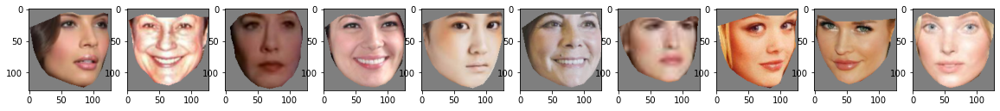

In [8]:
N_IMG = 10
fig, ax = plt.subplots(nrows=1, ncols=N_IMG, squeeze=False, figsize=(20, 5))
for i in range(N_IMG):
    ax[0, i].imshow(faces[i].permute(1, 2, 0))
plt.show()

In [9]:
BATCH_SIZE = 16

def get_batch(l, r, batch_size=BATCH_SIZE):
    batch = []
    for i in range(batch_size):
        idx = random.randint(l, r)
        batch.append(faces[idx])
    return torch.tensor(np.stack(batch, 0))

In [10]:
MEAN = 255/2
STD = 255/2

def norm(image):
    return (image.float() - MEAN) / STD

def denorm(image):
    return (image * STD + MEAN).int()

def cnt_params(model):
    return sum(p.numel() for p in model.parameters())

def set_lr(optimizer, lr):
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [11]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.nn.utils import spectral_norm

def OrtConv2d(*params, **named_params):
    conv = nn.Conv2d(*params, **named_params)
    nn.init.orthogonal_(conv.weight.data)
    return conv

def OrtLinear(*params, **named_params):
    lin = nn.Linear(*params, **named_params)
    nn.init.orthogonal_(lin.weight.data)
    return lin

def disable_spectral_norm(x):
    return x

class CBN2d(nn.Module):
    def __init__(self, num_features, num_conditions, num_z_features=0):
        super().__init__()
        self.bn = nn.BatchNorm2d(num_features, affine=False)
        self.embed_1 = nn.Conv2d(num_conditions + num_z_features, num_features, kernel_size=1, bias=False)
        self.embed_2 = nn.Conv2d(num_conditions + num_z_features, num_features, kernel_size=1, bias=False)

    def forward(self, x, y, z=None):
        y = y.reshape(y.shape[0], y.shape[1], 1, 1)
        if z is not None:
            y = y.repeat(1, 1, z.shape[2], z.shape[3])
            y = torch.cat((y, z), 1)
        gamma = self.embed_1(y)
        beta = self.embed_2(y)
        out = (1.0 + gamma) * self.bn(x) + beta
        return out

class DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample, optimized, sn=disable_spectral_norm):
        super().__init__()
        self.sn = sn
        self.downsample = downsample
        self.optimized = optimized
        self.learnable_sc = in_channels != out_channels or downsample
        
        self.conv1 = sn(OrtConv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.conv2 = sn(OrtConv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False))
        if self.learnable_sc:
            self.conv_sc = sn(OrtConv2d(in_channels, out_channels, kernel_size=1, bias=False))
        if sn != disable_spectral_norm:
            self.residual_coef = nn.Parameter(torch.zeros(1,), requires_grad=True)
        self.relu = nn.ReLU()
    
    def _residual(self, x):
        if not self.optimized:
            x = self.relu(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        if self.downsample:
            x = F.avg_pool2d(x, 2)
        return x
    
    def _shortcut(self, x):
        if self.learnable_sc:
            if self.optimized:
                x = self.conv_sc(F.avg_pool2d(x, 2)) if self.downsample else self.conv_sc(x)
            else:
                x = F.avg_pool2d(self.conv_sc(x), 2) if self.downsample else self.conv_sc(x)
        
        return x
    
    def forward(self, x):
        if self.sn != disable_spectral_norm:
            s = F.sigmoid(self.residual_coef)
            return self._shortcut(x) * s + self._residual(x) * (1 - s)
        return self._shortcut(x) + self._residual(x)
    
class GBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_conditions, z_cond, upsample):
        super().__init__()
        self.upsample = upsample
        self.learnable_sc = in_channels != out_channels or upsample
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.cbn1 = CBN2d(in_channels, num_conditions, z_cond)
        self.cbn2 = CBN2d(out_channels, num_conditions)
        if self.learnable_sc:
            self.conv_sc = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.relu = nn.ReLU()
    
    def _upsample_conv(self, x, conv):
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = conv(x)
        
        return x
    
    def _residual(self, x, y, z):
        x = self.relu(self.cbn1(x, y, z))
        x = self._upsample_conv(x, self.conv1) if self.upsample else self.conv1(x)
        x = self.relu(self.cbn2(x, y))
        x = self.conv2(x)
        return x
    
    def _shortcut(self, x):
        if self.learnable_sc:
            x = self._upsample_conv(x, self.conv_sc) if self.upsample else self.conv_sc(x)
            
        return x
    
    def forward(self, x, y, z=None):
        return self._shortcut(x) + self._residual(x, y, z)

class BigEncoder(nn.Module):
    def __init__(self, num_images, image_size, ch):
        super().__init__()
        
        self.image_size = image_size
        self.num_images = num_images
        
        blocks = []
        log_im_size = int(math.log(image_size, 2))
        assert math.log(image_size, 2) == log_im_size and image_size >= 32
        w = self.image_size
        first_block = True
        from_ch = num_images
        assert ch % (2 ** (log_im_size - 4)) == 0
        to_ch = ch // (2 ** (log_im_size - 4))
        
        while w > 4:
            blocks.append(DBlock(from_ch,
                                 to_ch,
                                 downsample=True,
                                 optimized=first_block))
            w //= 2
            first_block = False
            from_ch = to_ch
            if w > 8:
                to_ch *= 2
                
        self.blocks = nn.ModuleList(blocks)
    
    def forward(self, x):
        assert len(x.shape) == 4
        assert x.shape[1] == self.num_images and x.shape[2] == x.shape[3] and x.shape[3] == self.image_size
        
        skip = []
        
        w = self.image_size
        k = 0
        for block in self.blocks:
            x = block(x)
            if block.downsample:
                w //= 2
            skip.append(x)
        
        return skip
    
class Anonimizer(nn.Module):
    def __init__(self, encoder, filters, reverse=False, last_vector=0):
        super().__init__()
        self.reverse = reverse
        self.encoder = encoder
        self.convs = []
        for ch in filters:
            self.convs.append(nn.Conv2d(ch, ch, kernel_size=3, padding=1))
        self.convs = nn.ModuleList(self.convs)
        self.fc = None
        if last_vector > 0:
            self.fc = nn.Linear(filters[-1], last_vector)
        
    def forward(self, x):
        xs = self.encoder(x)
        for i in range(len(xs)):
            xs[i] = self.convs[i](xs[i])
        return xs[::-1] if self.reverse else xs, self.fc(torch.sum(F.relu(xs[-1]), dim=(2, 3)))

class SnCond(nn.Module):
    def __init__(self, sn=False):
        super().__init__()
        self.sn = sn
        if sn:
            self.length = nn.Parameter(torch.zeros(1), requires_grad=True)
        
    def forward(self, x, y):
        if self.sn:
            assert len(x.shape) == 2 and len(y.shape) == 2
            y = y / torch.norm(y, dim=1).reshape(-1, 1)
            y = y * F.sigmoid(self.length)
            return torch.sum(y * x, dim=1, keepdim=True)
        else:
            return torch.sum(y * x, dim=1, keepdim=True)
    
class BigRegressor(nn.Module):
    def __init__(self, num_images,
                 image_size,
                 ch=512,
                 num_classes=0,
                 sparse_num_classes=False,
                 encoder_num_images=0,
                 sn=disable_spectral_norm,
                 sn_mul=1,
                 n_outputs=1,
                 a_shape_list=None):
        
        super().__init__()
        self.n_outputs = n_outputs
        self.sn_mul = sn_mul
        self.sn = sn
        self.num_classes = num_classes
        self.sparse_num_classes = sparse_num_classes
        num_images = num_images + encoder_num_images
        self.num_images = num_images
        self.encoder_num_images = encoder_num_images
        self.image_size = image_size
        if num_classes > 0:
            self.sn_cond = SnCond(sn=(sn!=disable_spectral_norm))
            self.sn_sigma = nn.Parameter(torch.zeros(1,), requires_grad=True)

        if encoder_num_images > 0:
            self.z_mul = nn.Parameter(torch.ones(1, encoder_num_images, 1, 1), requires_grad=True)
        
        blocks = []
        log_im_size = int(math.log(image_size, 2))
        assert math.log(image_size, 2) == log_im_size and image_size >= 32
        w = self.image_size
        first_block = True
        from_ch = num_images
        assert ch % (2 ** (log_im_size - 4)) == 0
        to_ch = ch // (2 ** (log_im_size - 4))
        
        while w > 4:
            blocks.append(DBlock(from_ch, to_ch,
                                 downsample=True,
                                 sn=sn,
                                 optimized=first_block))
            w //= 2
            first_block = False
            from_ch = to_ch
            if w > 8:
                to_ch *= 2
                
        self.blocks = nn.ModuleList(blocks)
        
        self.relu = nn.ReLU()
        self.fc = sn(OrtLinear(to_ch, n_outputs, bias=False))
        if a_shape_list is not None:
            self.a_layers = nn.ModuleList([nn.Conv2d(ch, ch, kernel_size=3, padding=1) for ch in a_shape_list])
        if self.num_classes > 0:
            layer = nn.Embedding if sparse_num_classes else nn.Linear
            self.embed = layer(self.num_classes, to_ch)
    
    def forward(self, x, y=None, z=None, a=None):
        assert len(x.shape) == 4
        
        if self.num_classes > 0:
            assert self.n_outputs == 1
            assert y is not None
            assert y.shape[0] == x.shape[0]
            if not self.sparse_num_classes:
                assert len(y.shape) == 2
                assert y.shape[1] == self.num_classes
            else:
                assert len(y.shape) == 1
            y = self.embed(y)

        x = x * self.sn_mul
        if self.encoder_num_images > 0:
            x = torch.cat((x, z * self.z_mul), 1)
        
        i = 0
        a_i = 0
        w = self.image_size
        while i < len(self.blocks):
            x = self.blocks[i](x)
            if self.blocks[i].downsample:
                w //= 2
            i += 1
            if a is not None:
                x = x + self.a_layers[a_i](a[a_i])
            a_i += 1

        x = self.relu(x)
        if self.sn != disable_spectral_norm:
            x = torch.mean(x, dim=(2, 3))
        else:
            x = torch.sum(x, dim=(2, 3))
        
        out = self.fc(x)
        if self.num_classes > 0:
            if self.sn == disable_spectral_norm:
                out = out + self.sn_cond(x=x, y=y)
            else:
                s = F.sigmoid(self.sn_sigma)
                out = out * s + self.sn_cond(x=x, y=y) * (1 - s)
        
        return out

class BigGenerator(nn.Module):
    def __init__(self, num_images,
                 image_size,
                 latent_dim_mul=20,
                 ch=512,
                 num_classes=0,
                 sparse_num_classes=False,
                 encoder_image_size=0,
                 encoder_num_images=0,
                 bottleneck=nn.Tanh(),
                 a_shape_list=None):
        super().__init__()
        
        log_im_size = int(math.log(image_size, 2))
        assert math.log(image_size, 2) == log_im_size and image_size >= 32
        
        self.ch = ch
        self.num_images = num_images
        self.encoder_num_images = encoder_num_images
        self.sparse_num_classes = sparse_num_classes
        self.image_size = image_size
        encoder_image_size = image_size
        self.encoder_image_size = encoder_image_size
        self.latent_dim = latent_dim_mul * (log_im_size - 1)
        self.num_classes = num_classes
        self.num_chunk = log_im_size - 1
        
        if self.num_classes > 0:
            layer = nn.Embedding if sparse_num_classes else nn.Linear
            self.embed = layer(self.num_classes, self.num_classes)

        if self.encoder_num_images > 0:
            self.encoder = BigEncoder(num_images=self.encoder_num_images,
                                      image_size=self.encoder_image_size,
                                      ch=ch)

        num_latents = self.__get_num_latents()
        
        blocks = []
        w = 4
        from_ch = ch
        to_ch = from_ch
        
        self.fc = nn.Linear(num_latents[0], from_ch*4*4, bias=False)
        idx = 1
        while w < self.image_size:
            assert to_ch % 2 == 0
            blocks.append(GBlock(from_ch, to_ch,
                                 num_latents[idx],
                                 from_ch if self.encoder_num_images > 0 else 0 + (a_shape_list[idx - 1] if a_shape_list is not None else 0),
                                 upsample=True))
            w *= 2
            
            from_ch = to_ch
            to_ch //= 2
            idx += 1
        
        assert from_ch >= self.num_images * 4
            
        self.blocks = nn.ModuleList(blocks)
        
        self.bn = nn.BatchNorm2d(from_ch)
        self.relu = nn.ReLU()
        self.conv_last = nn.Conv2d(from_ch, self.num_images, kernel_size=3, padding=1, bias=False)
        self.tanh = bottleneck
        
        nn.init.constant_(self.bn.weight.data, 1.0)
        nn.init.constant_(self.bn.bias.data, 0.0)
    
    def __get_num_latents(self):
        xs = torch.empty(self.latent_dim).chunk(self.num_chunk)
        num_latents = [x.size(0) for x in xs]
        for i in range(0, self.num_chunk):
            num_latents[i] += self.num_classes
        return num_latents
    
    def forward(self, x=None, y=None, z=None, a=None):
        if self.num_classes > 0:
            assert y is not None
            if not self.sparse_num_classes:
                assert len(y.shape) == 2
                assert y.shape[1] == self.num_classes
            else:
                assert len(y.shape) == 1
            y = self.embed(y)

        if self.encoder_num_images > 0:
            assert z is not None
            encoded = self.encoder(z)
        else:
            encoded = []

        if x is not None:
            xs = x.chunk(self.num_chunk, dim=1)
        if self.num_classes > 0:
            if self.latent_dim > 0:
                h = self.fc(torch.cat([y, xs[0]], dim=1))
            else:
                h = self.fc(y)
        else:
            h = self.fc(xs[0])
        h = h.view(h.shape[0], self.ch, 4, 4)
        
        i = 0
        j = len(encoded) - 1
        k = 0
        a_i = 0
        w = 4
        while i < len(self.blocks):
            if self.num_classes > 0:
                if self.latent_dim > 0:
                    cond = torch.cat([y, xs[i + 1]], dim=1)
                else:
                    cond = y
            else:
                cond = xs[i + 1]
                
            cond_z = encoded[j] if len(encoded) > 0 else None
            if a is not None:
                if cond_z is None:
                    cond_z = a[a_i]
                else:
                    cond_z = torch.cat([cond_z, a[a_i]], 1)
            
            h = self.blocks[i](h, cond, cond_z)
                
            if self.blocks[i].upsample:
                w *= 2
            i += 1
            if j >= 0:
                j -= 1
            
            a_i += 1
        
        assert i == len(self.blocks) and j == max(len(encoded) - len(self.blocks) - 1, -1)
        
        return self.tanh(self.conv_last(self.relu(self.bn(h))))

In [12]:
def cnt_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [13]:
AE_IMAGE_SIZE = 64
DEVICE = 'cuda:0'
HIDDEN = 512
CH = 512
CLF_DIM = 1024

encoder = BigRegressor(num_images=3,
                             image_size=AE_IMAGE_SIZE,
                             n_outputs=HIDDEN,
                             ch=CH).to(DEVICE)

encoder.load_state_dict(torch.load("../input/autoencoder-2/encoder.pth"))

decoder = BigGenerator(num_images=3,
                         image_size=AE_IMAGE_SIZE,
                         num_classes=HIDDEN,
                         latent_dim_mul=0,
                         ch=CH).to(DEVICE)

decoder.load_state_dict(torch.load("../input/autoencoder-2/decoder_" + str(ATTRIBUTE_VALUE) + ".pth"))

print(encoder, "\nPARAMS - #", cnt_params(encoder))
print("\n----\n")
print(decoder, "\nPARAMS - #", cnt_params(decoder))
print("\n----\n")

BigRegressor(
  (blocks): ModuleList(
    (0): DBlock(
      (conv1): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(3, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (1): DBlock(
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (2): DBlock(
      (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(256, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (3): DBlock(
    

In [14]:
discriminator = BigRegressor(num_images=3,
                             image_size=IMAGE_SIZE,
                             encoder_num_images=3,
                             sn=spectral_norm,
                             ch=768).to(DEVICE)

generator = BigGenerator(num_images=3,
                         image_size=IMAGE_SIZE,
                         encoder_num_images=3,
                         num_classes=0,
                         ch=512).to(DEVICE)

In [15]:
if False:
    generator.load_state_dict(torch.load("../input/finetune-attribute-swap/generator.pth"))
    discriminator.load_state_dict(torch.load("../input/finetune-attribute-swap/discriminator.pth"))

In [16]:
print(discriminator, "\n", cnt_params(discriminator))
print("\n-----\n")
print(generator, "\n", cnt_params(generator))

BigRegressor(
  (blocks): ModuleList(
    (0): DBlock(
      (conv1): Conv2d(6, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(6, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (1): DBlock(
      (conv1): Conv2d(96, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(192, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (2): DBlock(
      (conv1): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv_sc): Conv2d(192, 384, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (relu): ReLU()
    )
    (3): DBlock(
      (con

In [17]:
N_ITER = 35001
EXP_AVG_COEF = 0.99
PLOT_DIV = 1750
SAVE_DIV = 3500
REDUCE = 5
N_VIS = 5

TRAIN_COEF = 3/4
train = int(round(BLOCK_SIZE * TRAIN_COEF))

ND = 2
NG = 1
BETAS = (0.5, 0.999)
LR = 0.0002
LABEL_NOICE = 0
CLIPPING = 1
LAMBDA = 0

USE_WGAN = False

RND_HIDDEN = 120

In [18]:
optimizer_generator =  torch.optim.Adam(list(generator.parameters()), LR, betas=BETAS)
optimizer_discriminator = torch.optim.Adam(list(discriminator.parameters()), LR, betas=BETAS)

In [19]:
if False:
    optimizer_generator.load_state_dict(torch.load("../input/finetune-attribute-swap/optimizer_generator.pth"))
    optimizer_discriminator.load_state_dict(torch.load("../input/finetune-attribute-swap/optimizer_discriminator.pth"))

In [20]:
def update_loss_list(losses, loss, exp_avg_coef):
    if len(losses) == 0:
        losses.append(loss)
    else:
        losses.append(exp_avg_coef * losses[-1] + (1 - exp_avg_coef) * loss)

In [21]:
def save_weights(suffix=""):
    torch.save(generator.state_dict(), "generator" + suffix + ".pth")
    torch.save(discriminator.state_dict(), "discriminator" + suffix + ".pth")
    torch.save(optimizer_generator.state_dict(), "optimizer_generator" + suffix + ".pth")
    torch.save(optimizer_discriminator.state_dict(), "optimizer_discriminator" + suffix + ".pth")

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


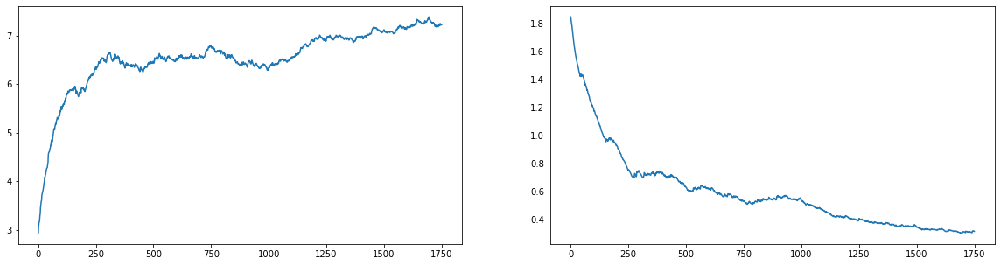

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


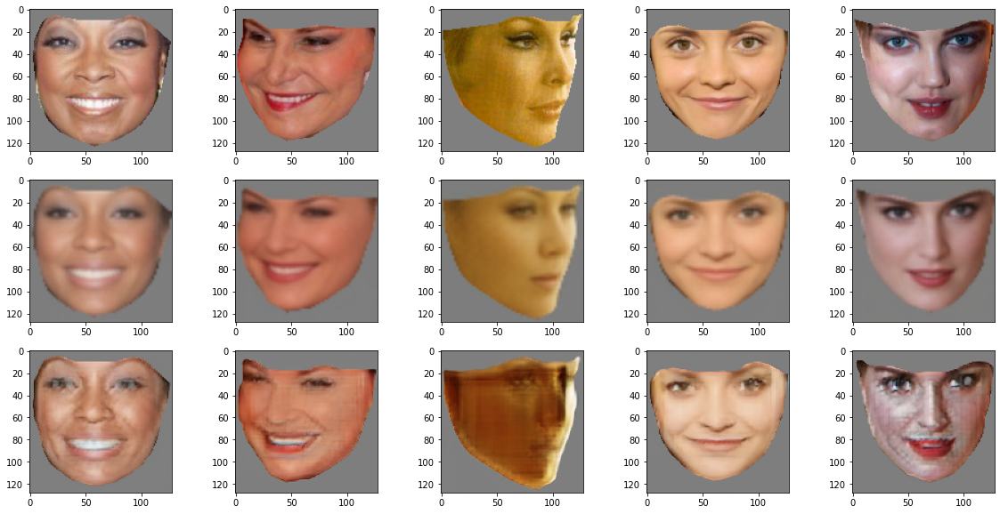

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


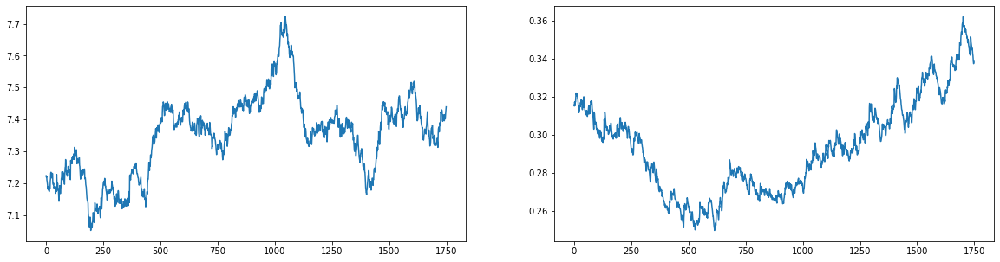

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


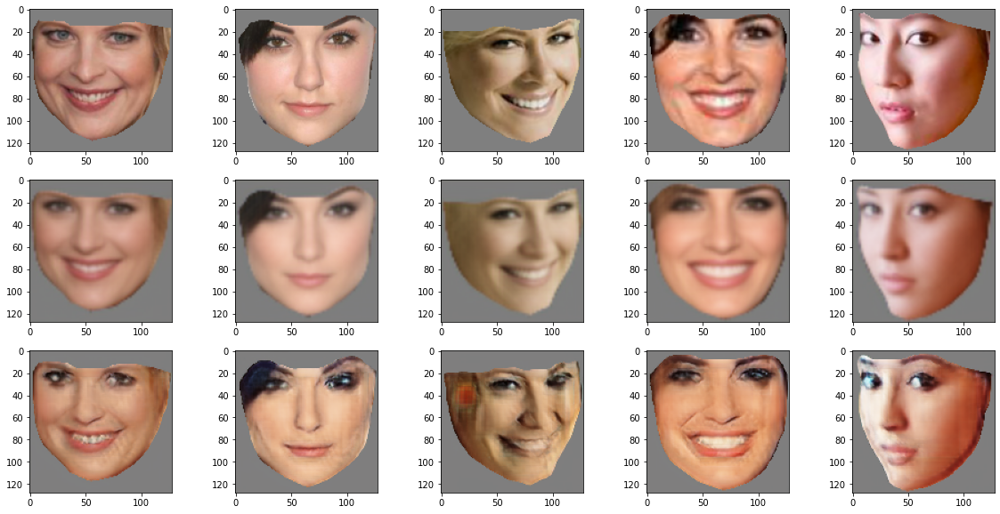

Weights saved, suffix - 0


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


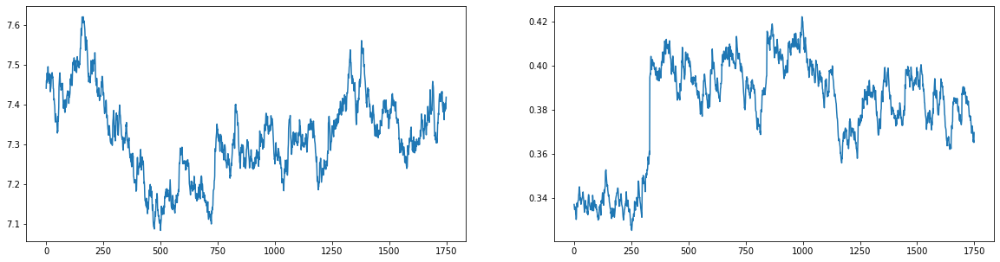

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


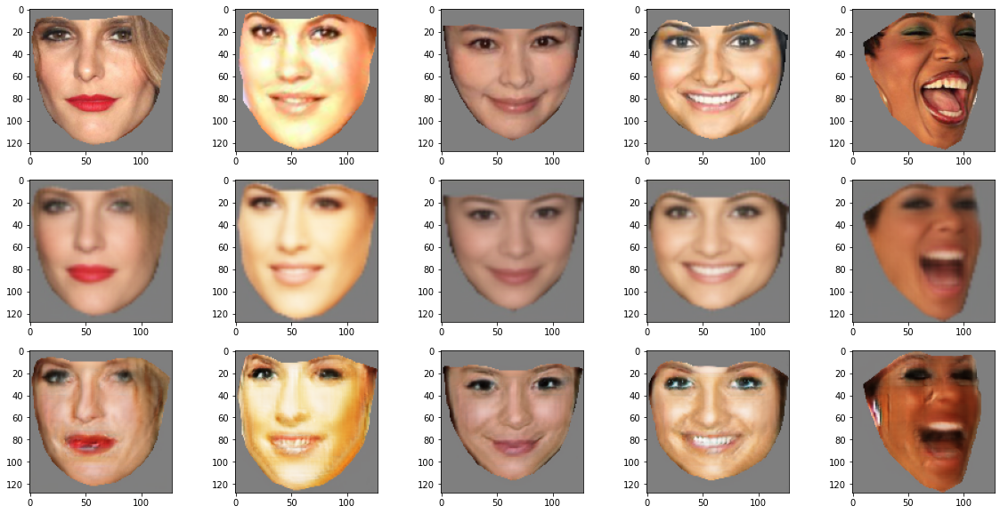

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


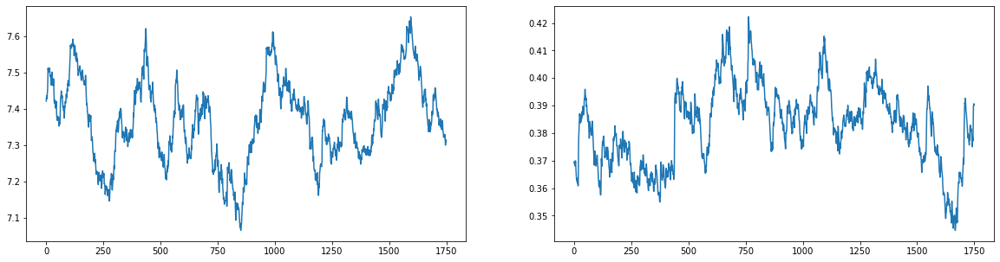

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


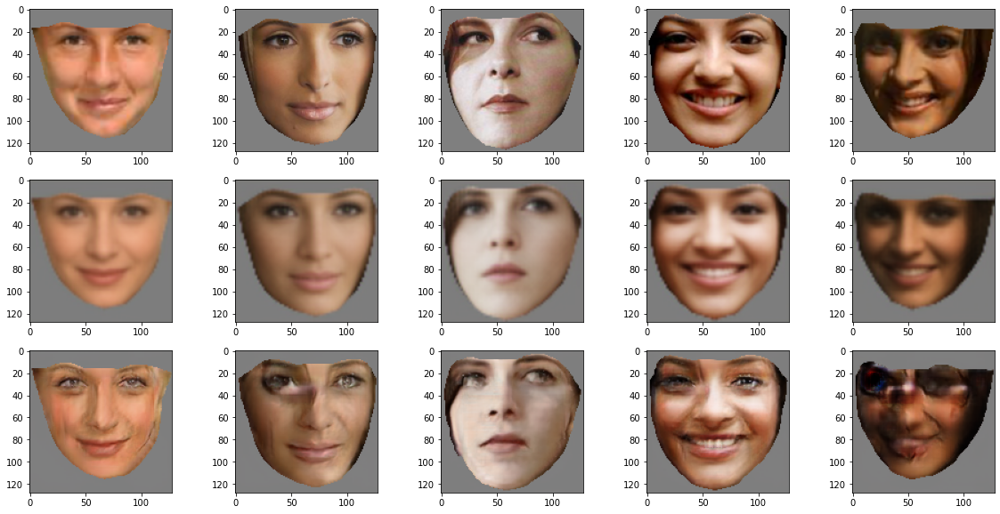

Weights saved, suffix - 1


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


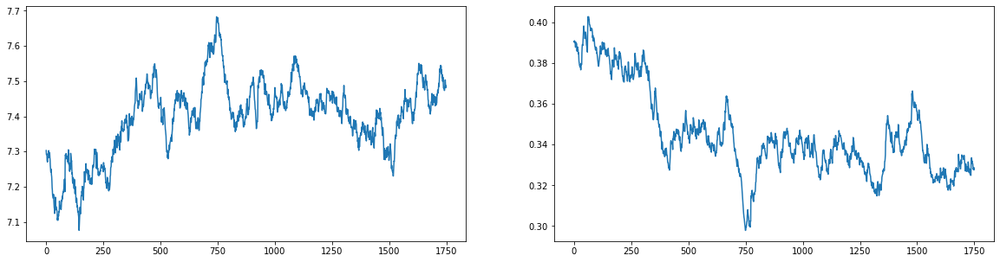

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


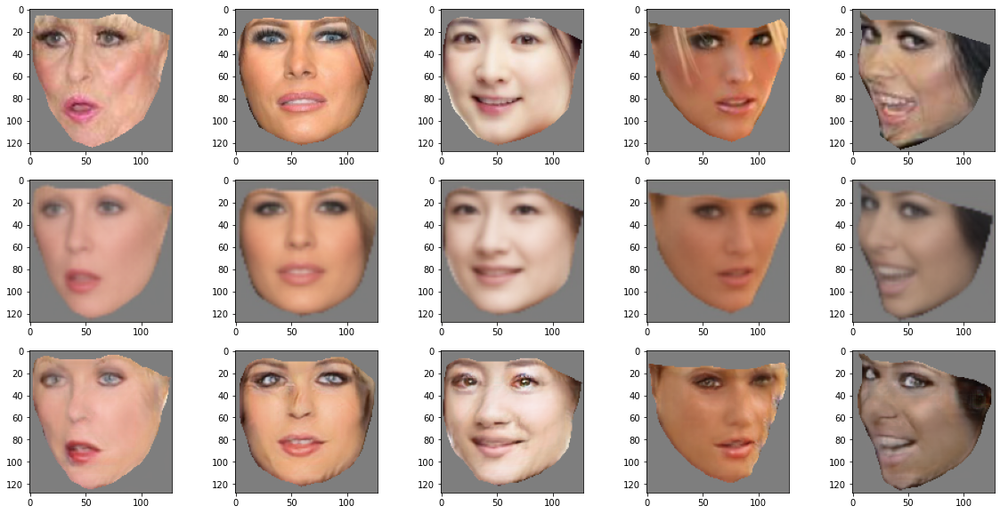

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


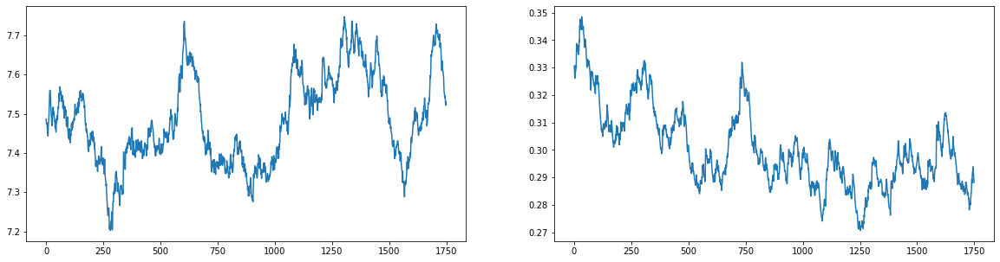

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


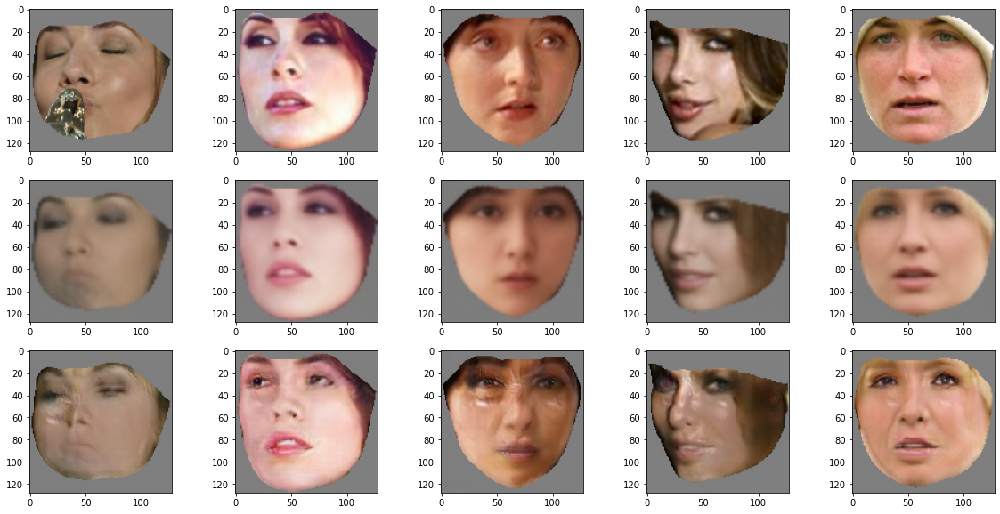

Weights saved, suffix - 2


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


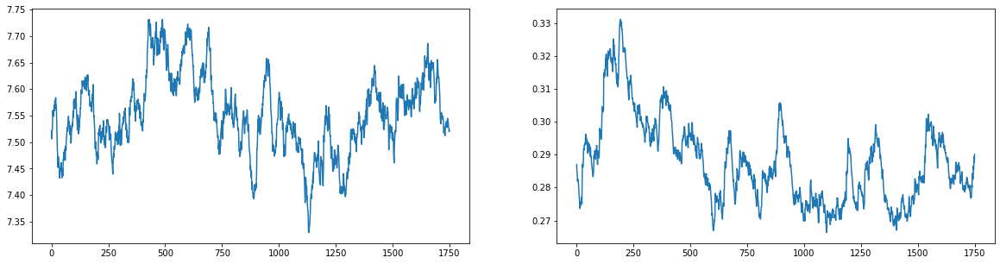

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


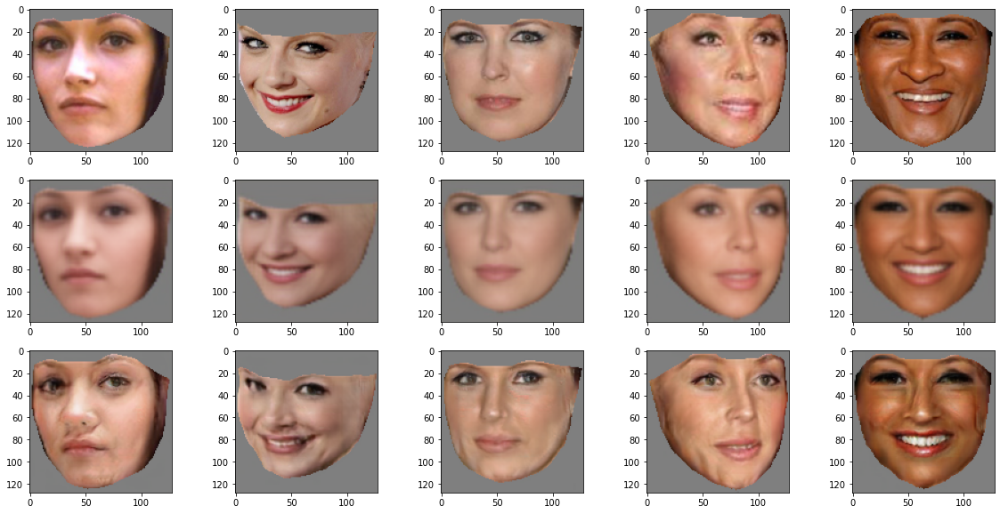

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


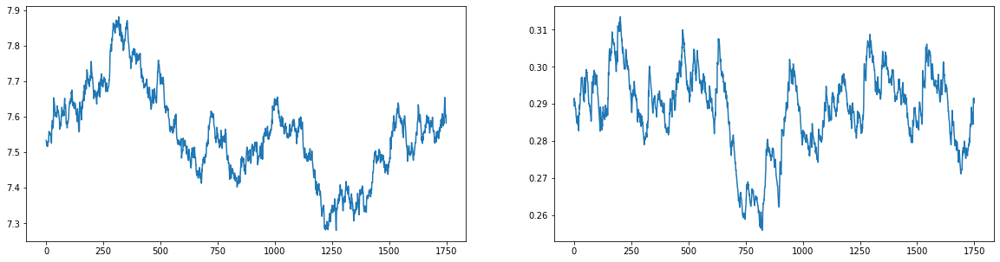

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


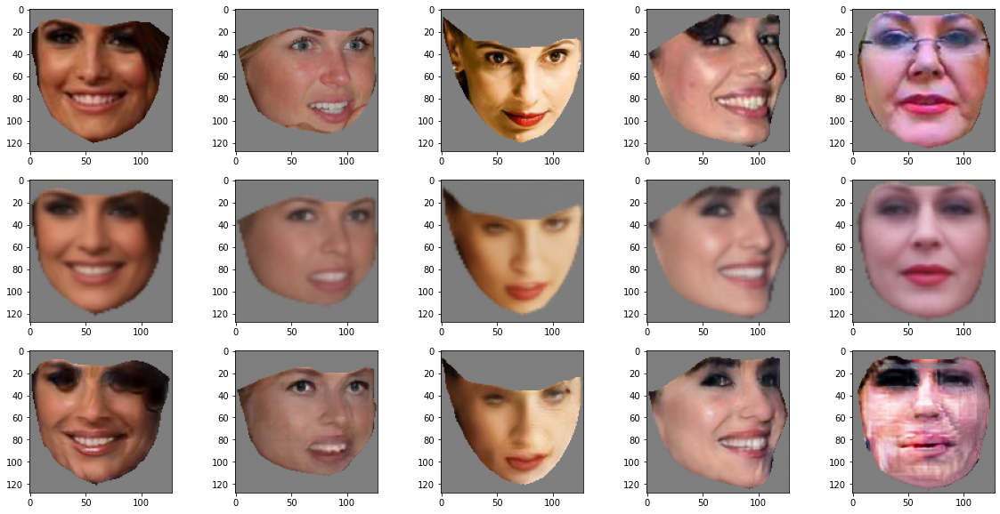

Weights saved, suffix - 3


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


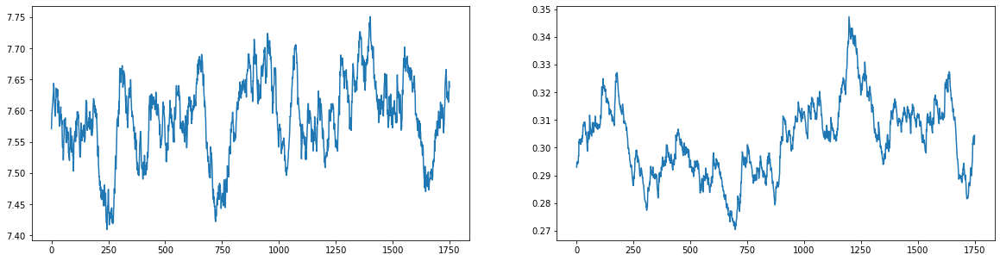

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


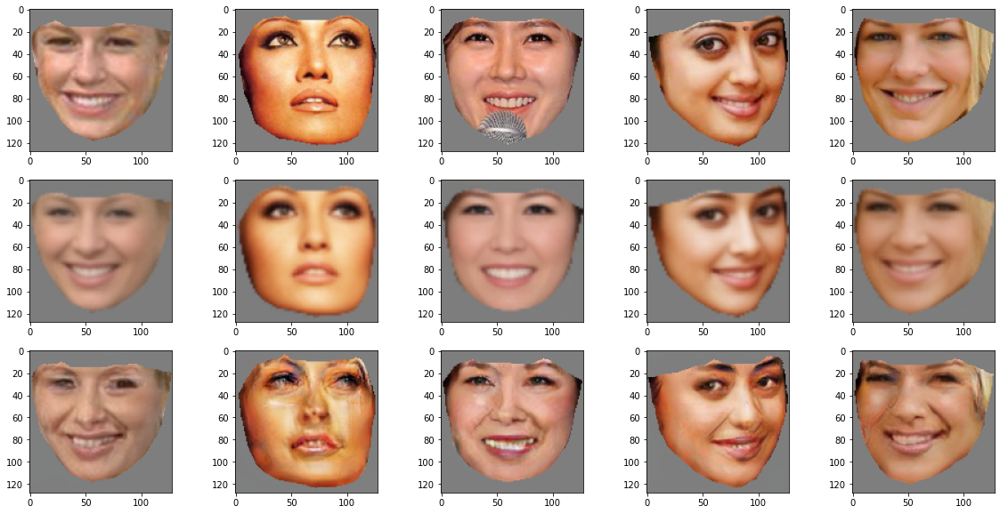

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


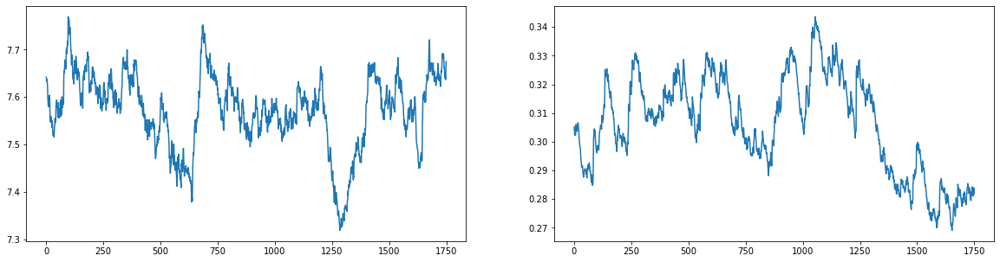

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


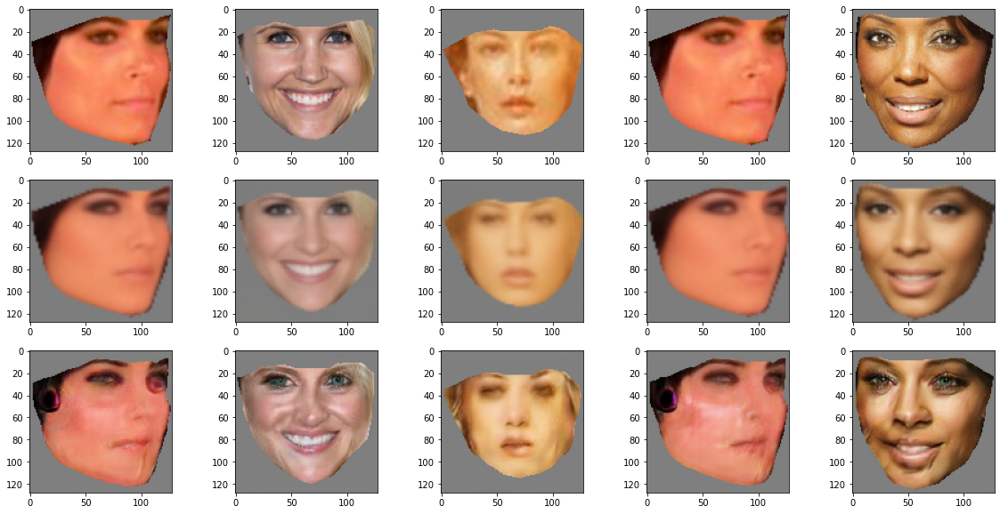

Weights saved, suffix - 4


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


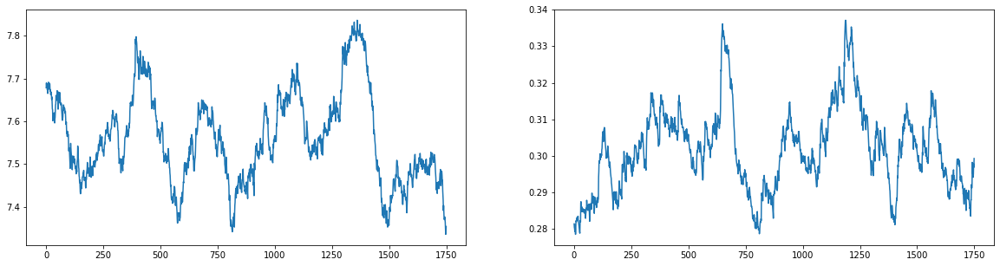

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


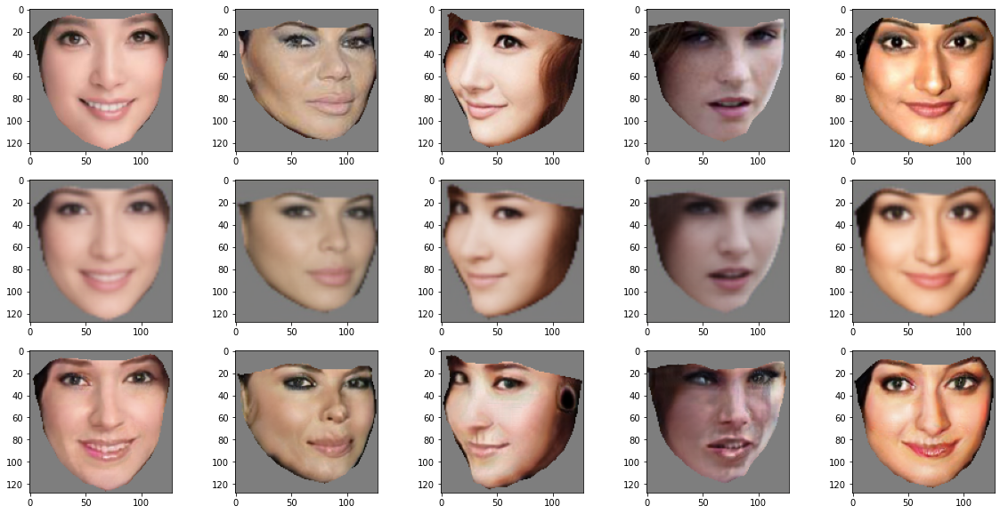

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


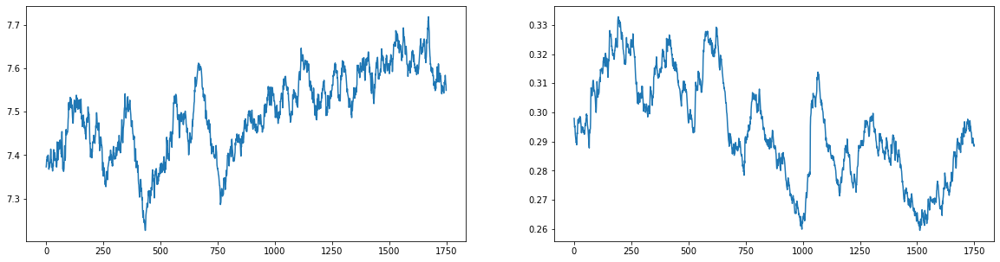

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


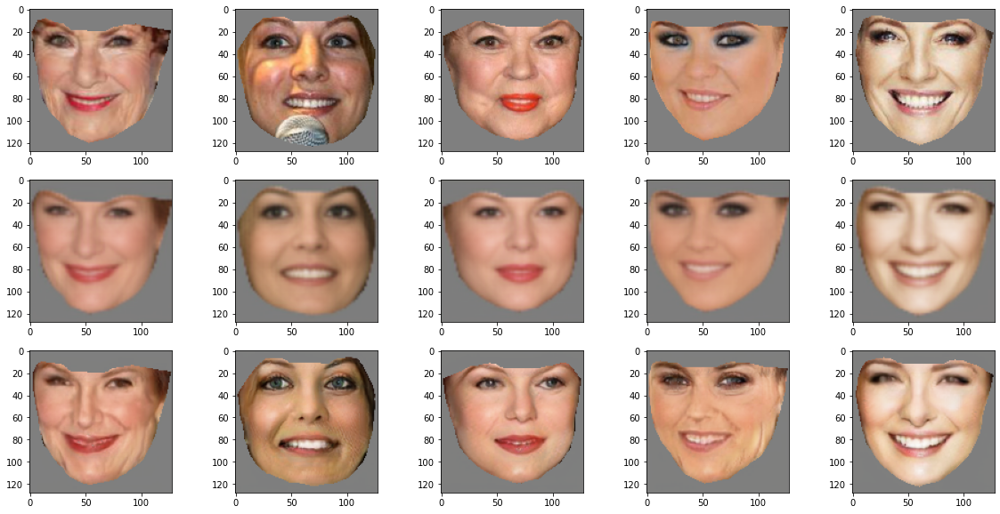

Weights saved, suffix - 5


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


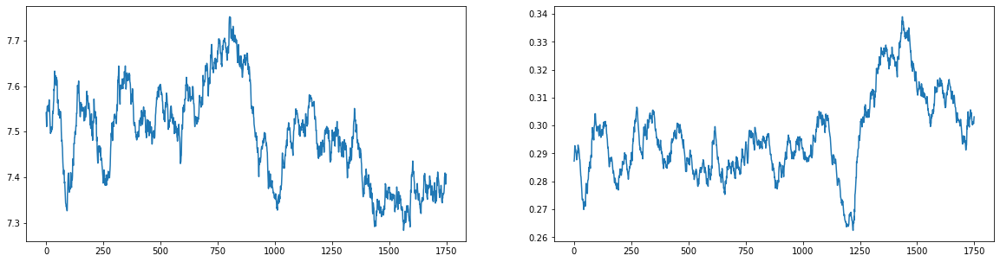

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


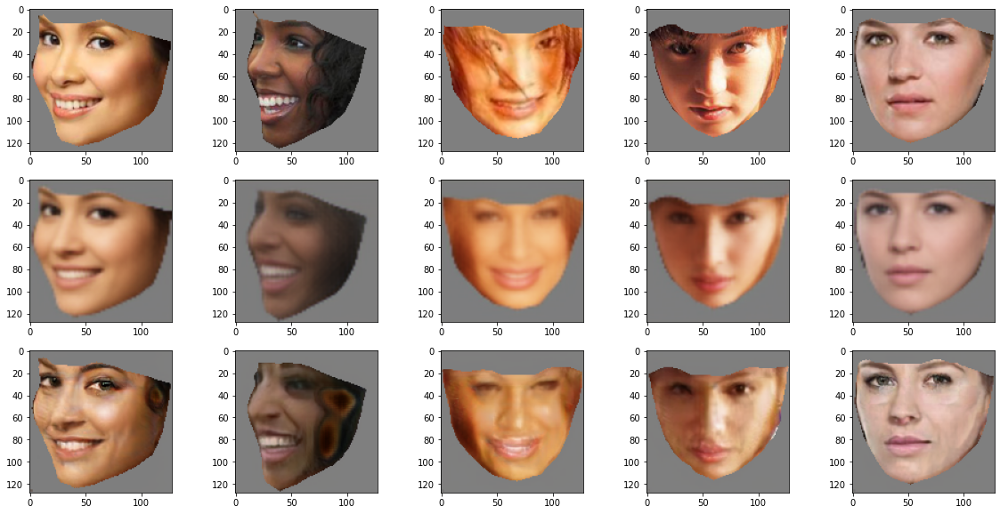

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


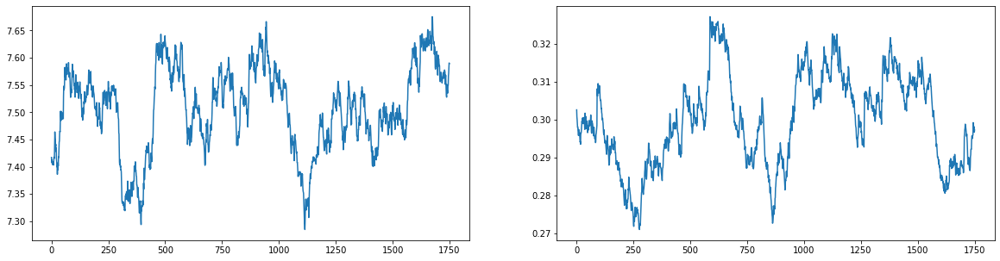

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


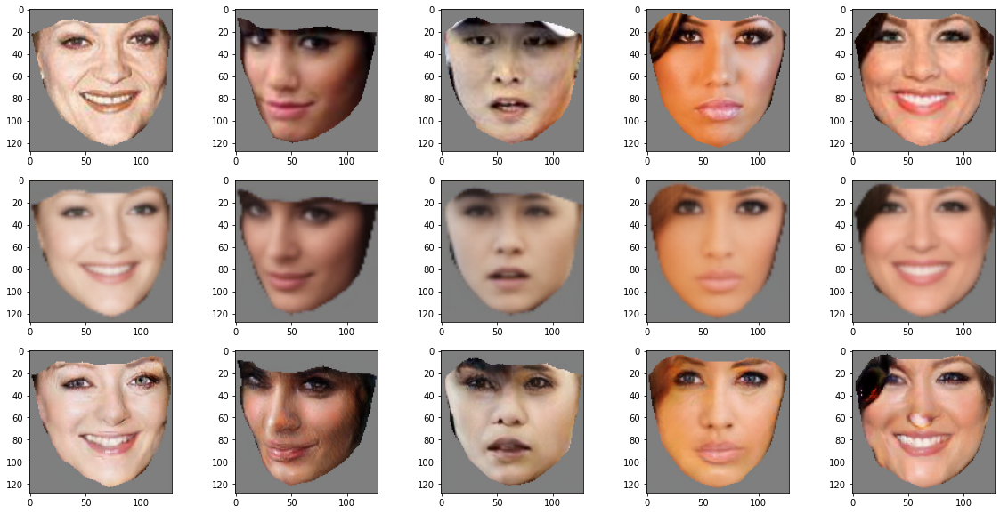

Weights saved, suffix - 6


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


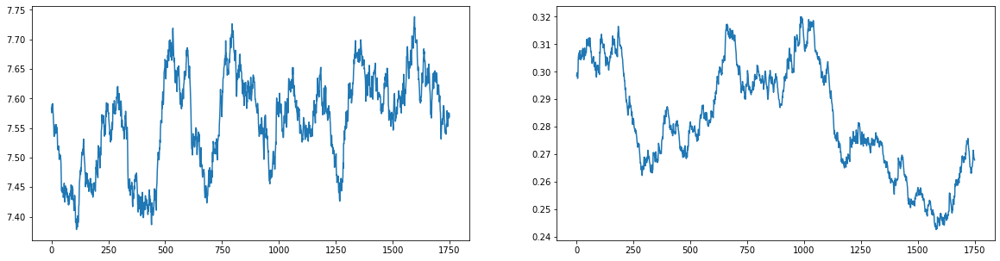

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


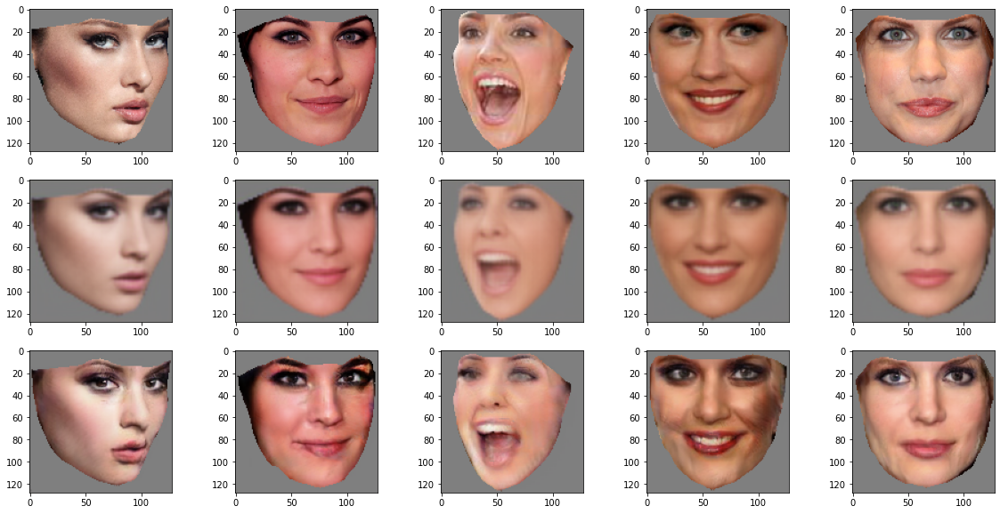

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


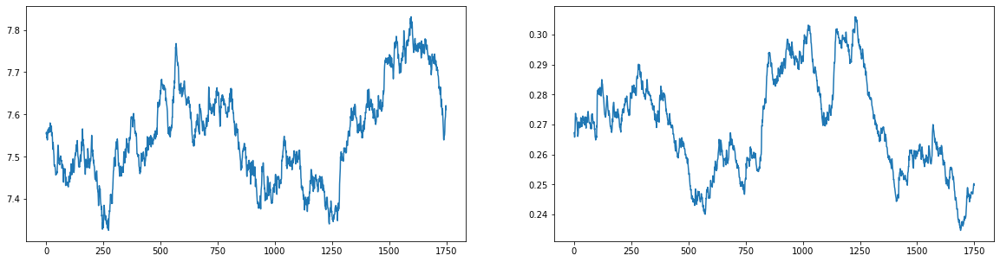

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


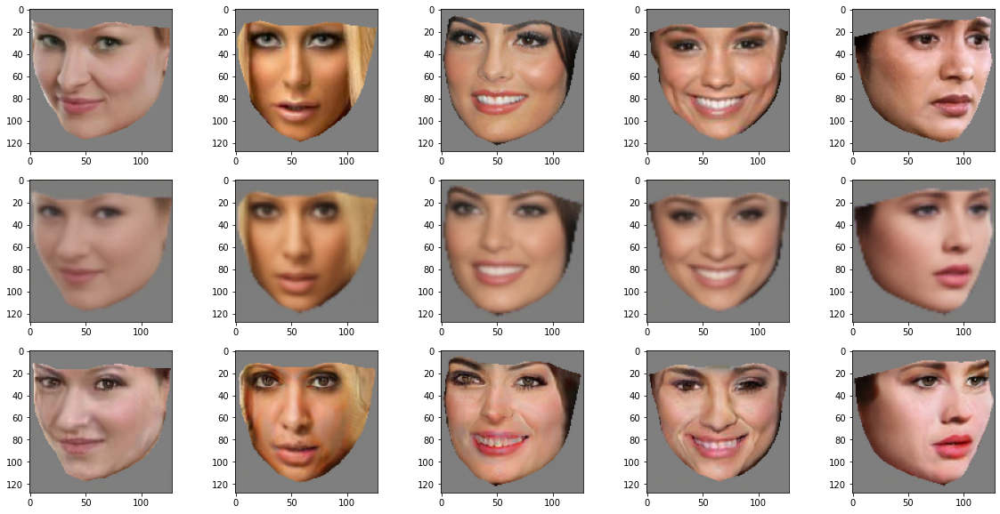

Weights saved, suffix - 7


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


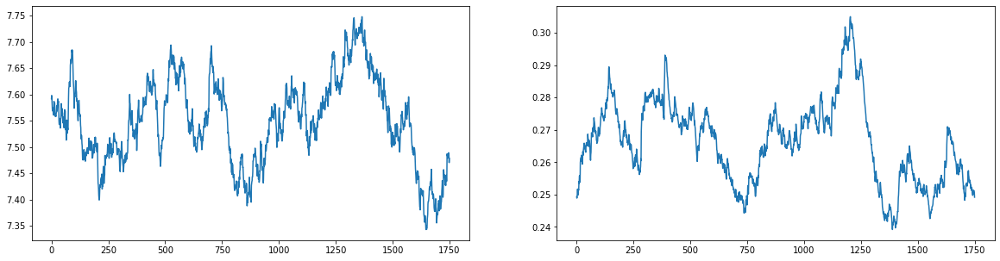

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


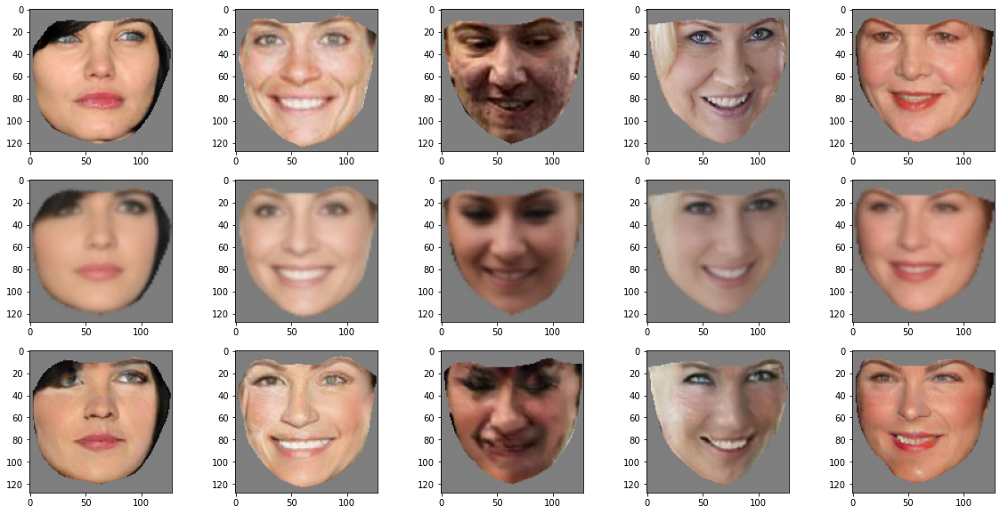

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


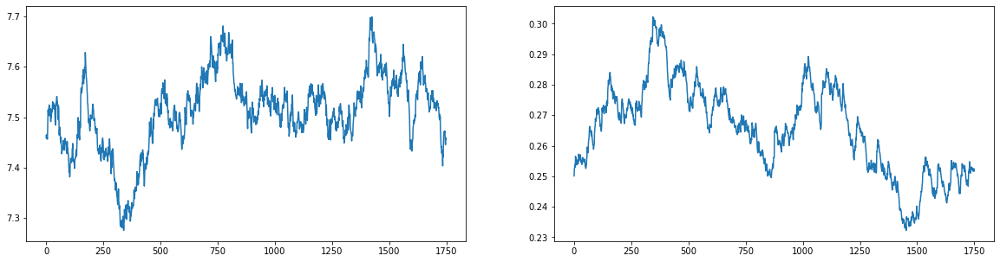

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


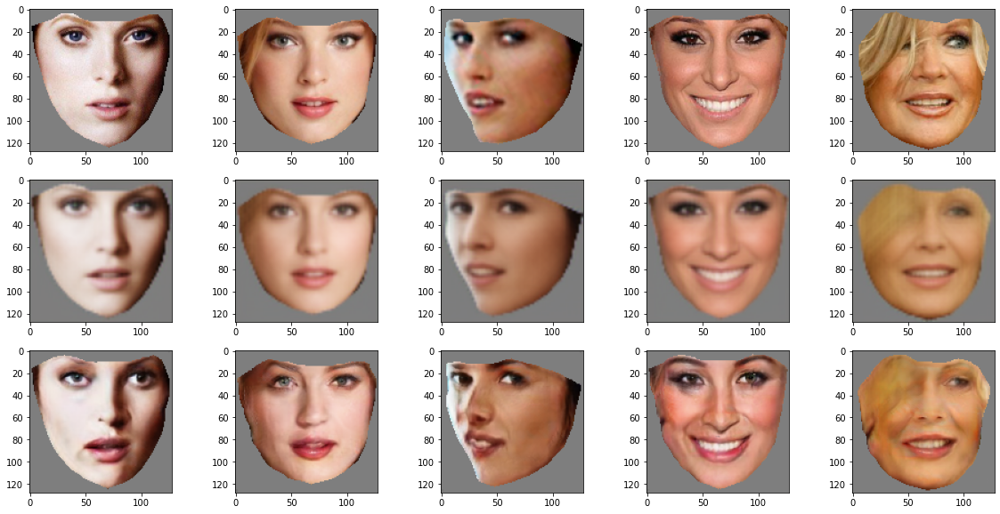

Weights saved, suffix - 8


/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


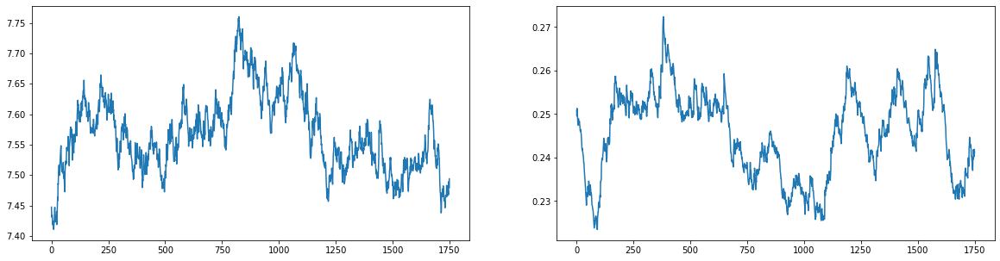

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


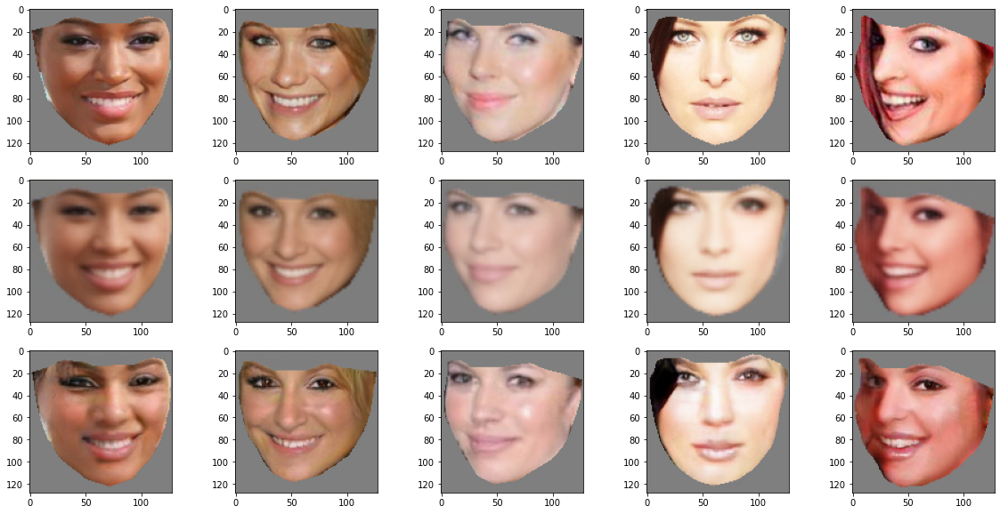

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


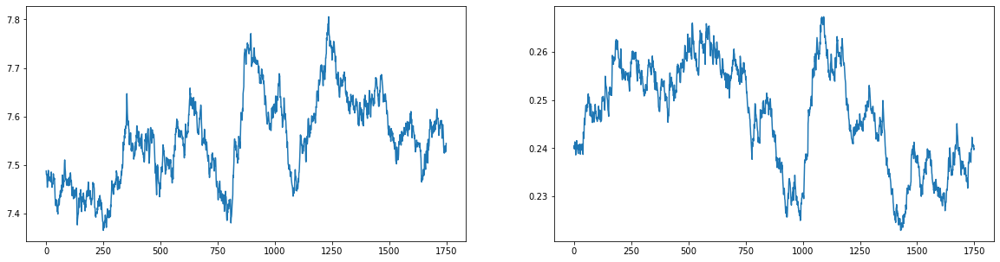

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


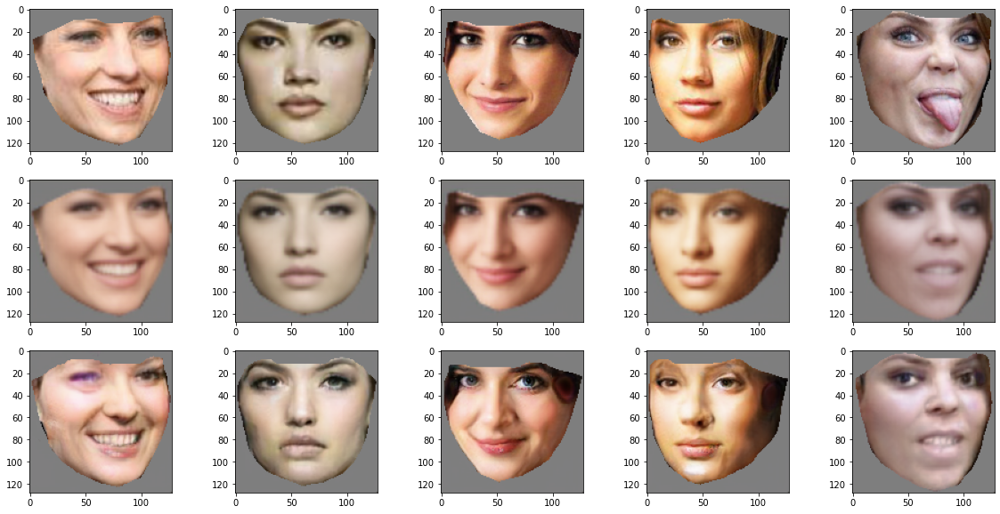

Weights saved, suffix - 9



In [22]:
cnt_train = 0
save_cnt = 0
losses_dis = []
losses_gan = []

for t in tqdm(range(0, N_ITER)):
    update_df()
    cnt_train += 1
    for _ in range(ND):
        batch_X = norm(get_batch(0, train).to(DEVICE))
        batch_y = batch_X.detach().clone() 

        with torch.no_grad():
            hidden = encoder(F.interpolate(batch_X, AE_IMAGE_SIZE, mode='bilinear'))
            logits = F.interpolate(decoder(y=hidden), IMAGE_SIZE, mode='bilinear')
            sample = generator(torch.randn(batch_X.shape[0], RND_HIDDEN).to(DEVICE), z=logits, y=hidden)

        if not(LABEL_NOICE is None) and LABEL_NOICE > 0 and LABEL_NOICE < 0.5:
            with torch.no_grad():
                swap = torch.distributions.Uniform(torch.zeros(batch_X.size(0),), torch.ones(batch_X.size(0),)).sample().float()
                swap = (swap <= np.percentile(swap, LABEL_NOICE * 100)).float()
                swap = swap.view(swap.shape[0], 1, 1, 1)
                swap = swap.to(DEVICE)

            discriminated_fake = discriminator((1 - swap) * sample + swap *       batch_y, z=logits)
            discriminated_real = discriminator(swap *       sample + (1 - swap) * batch_y, z=logits)
        else:
            discriminated_fake = discriminator(sample, z=logits)
            discriminated_real = discriminator(batch_y, z=logits)

        optimizer_discriminator.zero_grad()
        if USE_WGAN:
            loss_gan_d = torch.mean(discriminated_real - discriminated_fake)
        else:
            loss_gan_d = torch.mean((discriminated_real - torch.mean(discriminated_fake) + 1) ** 2) + \
                         torch.mean((discriminated_fake - torch.mean(discriminated_real) - 1) ** 2)
        loss_gan_d.backward()
        torch.nn.utils.clip_grad.clip_grad_norm_(discriminator.parameters(), CLIPPING)
        optimizer_discriminator.step()    

    update_loss_list(losses_dis, loss_gan_d.item(), EXP_AVG_COEF)
    
    
    
    for _ in range(NG):
        batch_X = norm(get_batch(0, train).to(DEVICE))
        batch_y = batch_X.detach().clone() 

        with torch.no_grad():
            encoder.eval()
            hidden = encoder(F.interpolate(batch_X, AE_IMAGE_SIZE, mode='bilinear'))
            encoder.train()

        logits = F.interpolate(decoder(y=hidden), IMAGE_SIZE, mode='bilinear')
        sample = generator(torch.randn(batch_X.shape[0], RND_HIDDEN).to(DEVICE), z=logits, y=hidden)

        discriminated_fake = discriminator(sample, z=logits)
        discriminated_real = discriminator(batch_y, z=logits)

        optimizer_generator.zero_grad()
        if USE_WGAN:
            loss_gan_g = torch.mean(discriminated_fake - discriminated_real)
        else:
            loss_gan_g = torch.mean((discriminated_fake - torch.mean(discriminated_real) + 1) ** 2) + \
                         torch.mean((discriminated_real - torch.mean(discriminated_fake) - 1) ** 2)
        loss_gan_g.backward()
        torch.nn.utils.clip_grad.clip_grad_norm_(generator.parameters(), CLIPPING)
        optimizer_generator.step()

    update_loss_list(losses_gan, loss_gan_g.item(), EXP_AVG_COEF)
    
    

    if t > 0 and t % PLOT_DIV == 0:
        generator.eval()
        encoder.eval()
        decoder.eval()

        fig, ax = plt.subplots(nrows=1, ncols=2, squeeze=False, figsize=(20, 5))
        ax[0, 0].plot(np.arange(0, len(losses_gan[-cnt_train:])), np.array(losses_gan[-cnt_train:]))
        ax[0, 1].plot(np.arange(0, len(losses_dis[-cnt_train:])), np.array(losses_dis[-cnt_train:]))
        plt.show()

        with torch.no_grad():
            batch_X = norm(get_batch(train, BLOCK_SIZE - 1, batch_size=N_VIS).to(DEVICE))
            hidden = encoder(F.interpolate(batch_X, AE_IMAGE_SIZE, mode='bilinear'))
            logits = F.interpolate(decoder(y=hidden), IMAGE_SIZE, mode='bilinear')
            sample = generator(torch.randn(N_VIS, RND_HIDDEN).to(DEVICE), z=logits, y=hidden)

            fig, ax = plt.subplots(nrows=3, ncols=N_VIS, squeeze=False, figsize=(20, 10))
            for j in range(N_VIS):
                ax[0, j].imshow(denorm(batch_X[j]).permute(1, 2, 0).cpu().numpy())
                ax[1, j].imshow(denorm(logits[j]).permute(1, 2, 0).cpu().numpy())
                ax[2, j].imshow(denorm(sample[j]).permute(1, 2, 0).cpu().numpy())
            plt.show()

        generator.train()
        encoder.train()
        decoder.train()
        
        cnt_train = 0
        
    if t > 0 and t % SAVE_DIV == 0:
        print("Weights saved, suffix -", save_cnt)
        save_weights("_" + str(save_cnt))
        save_cnt += 1

In [23]:
save_weights()

In [24]:
loader_process.kill()
loader_process.join()

In [25]:
!ls -alh

total 5.1G
drwxr-xr-x 2 root root 4.0K May  4 16:11 .
drwxr-xr-x 6 root root 4.0K May  4 09:22 ..
---------- 1 root root  14M May  4 16:11 __notebook__.ipynb
-rw-r--r-- 1 root root  85M May  4 16:11 discriminator.pth
-rw-r--r-- 1 root root  85M May  4 10:10 discriminator_0.pth
-rw-r--r-- 1 root root  85M May  4 10:50 discriminator_1.pth
-rw-r--r-- 1 root root  85M May  4 11:29 discriminator_2.pth
-rw-r--r-- 1 root root  85M May  4 12:10 discriminator_3.pth
-rw-r--r-- 1 root root  85M May  4 12:50 discriminator_4.pth
-rw-r--r-- 1 root root  85M May  4 13:30 discriminator_5.pth
-rw-r--r-- 1 root root  85M May  4 14:10 discriminator_6.pth
-rw-r--r-- 1 root root  85M May  4 14:51 discriminator_7.pth
-rw-r--r-- 1 root root  85M May  4 15:31 discriminator_8.pth
-rw-r--r-- 1 root root  85M May  4 16:11 discriminator_9.pth
-rw-r--r-- 1 root root  72M May  4 16:11 generator.pth
-rw-r--r-- 1 root root  72M May  4 10:10 generator_0.pth
-rw-r--r-- 1 root root  72M May  4 10:50 generator_1.pth
-rw-